In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from glob import glob
from tqdm.notebook import tqdm
tqdm.pandas()
import cv2, warnings
warnings.filterwarnings('ignore')
import tensorflow as tf
from tensorflow.keras.layers import Dense, Flatten, Input, Add, Dropout, LSTM, TimeDistributed, Embedding, RepeatVector, Concatenate, Bidirectional, Convolution2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import ModelCheckpoint

# Importing Dataset

In [2]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
! mkdir ~/.kaggle

In [11]:
! cp kaggle.json ~/.kaggle/

In [12]:
! chmod 600 ~/.kaggle/kaggle.json

In [13]:
! kaggle datasets download nunenuh/flickr8k

 98% 1.02G/1.04G [00:16<00:00, 119MB/s]
100% 1.04G/1.04G [00:16<00:00, 68.3MB/s]


In [14]:
!unzip /content/flickr8k.zip

Streaming output truncated to the last 5000 lines.
  inflating: images/2844747252_64567cf14a.jpg  
  inflating: images/2844846111_8c1cbfc75d.jpg  
  inflating: images/2844963839_ff09cdb81f.jpg  
  inflating: images/2845246160_d0d1bbd6f0.jpg  
  inflating: images/2845691057_d4ab89d889.jpg  
  inflating: images/2845845721_d0bc113ff7.jpg  
  inflating: images/2846037553_1a1de50709.jpg  
  inflating: images/2846785268_904c5fcf9f.jpg  
  inflating: images/2846843520_b0e6211478.jpg  
  inflating: images/2847514745_9a35493023.jpg  
  inflating: images/2847615962_c330bded6e.jpg  
  inflating: images/2847859796_4d9cb0d31f.jpg  
  inflating: images/2848266893_9693c66275.jpg  
  inflating: images/2848571082_26454cb981.jpg  
  inflating: images/2848895544_6d06210e9d.jpg  
  inflating: images/2848977044_446a31d86e.jpg  
  inflating: images/2849194983_2968c72832.jpg  
  inflating: images/2850719435_221f15e951.jpg  
  inflating: images/2851198725_37b6027625.jpg  
  inflating: images/2851304910_b57211

In [15]:
img_path = '/content/images'
images = glob(img_path+'/*.jpg')
images[:5]

['/content/images/109202801_c6381eef15.jpg',
 '/content/images/3016521240_2ef20834b6.jpg',
 '/content/images/1026685415_0431cbf574.jpg',
 '/content/images/1107246521_d16a476380.jpg',
 '/content/images/3132832452_c354c6396c.jpg']

In [16]:
len(images)

8091

In [17]:
captions = open('/content/captions.txt','rb').read().decode('utf-8').split('\n')
captions[:5]

['image_name|caption_number|caption_text',
 '1000268201_693b08cb0e.jpg|0|A child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg|1|A girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg|2|A little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg|3|A little girl climbing the stairs to her playhouse .']

In [18]:
len(captions)

40457

#Visualizing images with their captions

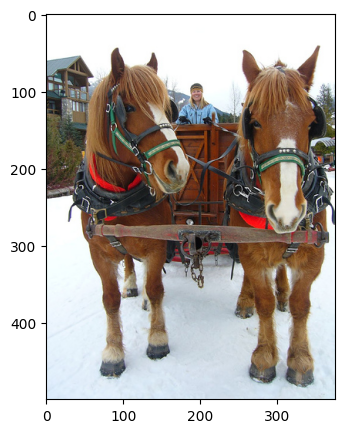

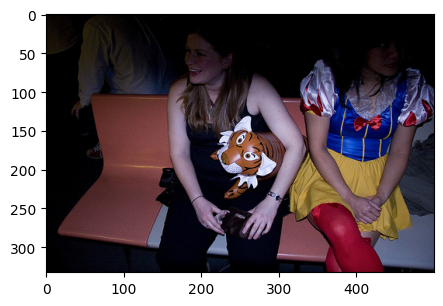

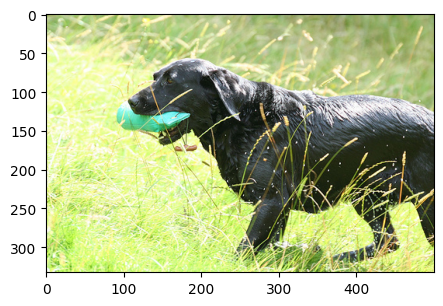

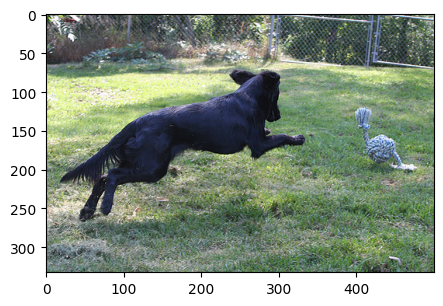

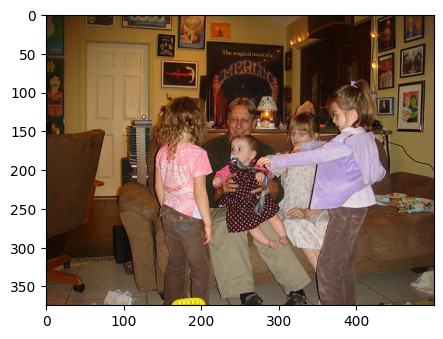

In [19]:
for i in range(5):
    plt.figure(figsize=(5,5))
    img = cv2.imread(images[i])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img);

#Downloading the ResNet50 inception model

In [20]:
inception_model = ResNet50(include_top=True)
inception_model.summary()

102967424/102967424 [==============================] - 0s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                        

In [21]:
last = inception_model.layers[-2].output # Output of the penultimate layer of ResNet model
model = Model(inputs=inception_model.input,outputs=last)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

#Extracting features from images

In [22]:
img_features = {}
count = 0

for img_path in tqdm(images):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img = cv2.resize(img,(224,224)) # ResNet model requires images of dimensions (224,224,3)
    img = img.reshape(1,224,224,3) # Reshaping image to the dimensions of a single image
    features = model.predict(img).reshape(2048,) # Feature extraction from images
    img_name = img_path.split('/')[-1] # Extracting image name
    img_features[img_name] = features
    count += 1
    # Fetching the features of only 1500 images as using more than 1500 images leads to overloading memory issues
    if count == 1500:
        break
    if count % 50 == 0:
        print(count)

  0%|          | 0/8091 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step
50
1/1 [==============================] - 0s 24ms/step
100
1/1 [==============================] - 0s 23ms/step
150
1/1 [==============================] - 0s 24ms/step
200
1/1 [==============================] - 0s 33ms/step
250
1/1 [==============================] - 0s 24ms/step
300
1/1 [==============================] - 0s 23ms/step
350
1/1 [==============================] - 0s 33ms/step
400
1/1 [==============================] - 0s 22ms/step
450
1/1 [==============================] - 0s 31ms/step
500
1/1 [==============================] - 0s 22ms/step
550
1/1 [==============================] - 0s 35ms/step
600
1/1 [==============================] - 0s 22ms/step
650
1/1 [==============================] - 0s 24ms/step
700
1/1 [==============================] - 0s 42ms/step
750
1/1 [==============================] - 0s 22ms/step
800
1/1 [==============================] - 0s 22ms/step
850
1/1 [==============================] - 0s 27ms/st

In [23]:
len(img_features)

1500

#Preprocessing the captions text

In [24]:
captions = captions[1:]
captions[:5]

['1000268201_693b08cb0e.jpg|0|A child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg|1|A girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg|2|A little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg|3|A little girl climbing the stairs to her playhouse .',
 '1000268201_693b08cb0e.jpg|4|A little girl in a pink dress going into a wooden cabin .']

In [25]:
len(captions)

40456

In [26]:
captions[8].split('|')[2]

'Two dogs of different breeds looking at each other on the road .'

In [27]:
captions_dict = {}

for cap in captions:
    try:
        img_name = cap.split('|')[0]
        caption = cap.split('|')[2]
        # Each image has 5 captions
        if img_name in img_features:
            if img_name not in captions_dict:
                captions_dict[img_name] = [caption] # Storing the first caption
            else:
                captions_dict[img_name].append(caption) # Adding the remaining captions
    except:
        break

In [28]:
len(captions_dict)

1500

In [29]:
print(captions_dict)

{'1007129816_e794419615.jpg': ['A man in an orange hat starring at something .', 'A man wears an orange hat and glasses .', 'A man with gauges and glasses is wearing a Blitz hat .', 'A man with glasses is wearing a beer can crocheted hat .', 'The man with pierced ears is wearing glasses and an orange hat .'], '1022454428_b6b660a67b.jpg': ['A couple and an infant , being held by the male , sitting next to a pond with a near by stroller .', 'A couple sit on the grass with a baby and stroller .', 'A couple with their newborn baby sitting under a tree facing a lake .', 'A man and woman care for an infant along the side of a body of water .', 'Couple with a baby sit outdoors next to their stroller .'], '1026685415_0431cbf574.jpg': ['A black dog carries a green toy in his mouth as he walks through the grass .', 'A black dog carrying something through the grass .', 'A black dog has a blue toy in its mouth .', 'A dog in grass with a blue item in his mouth .', 'A wet black dog is carrying a gre

In [30]:
def text_preprocess(text):
    modified_text = text.lower() # Converting text to lowercase
    modified_text = 'startofseq ' + modified_text + ' endofseq' # Appending the special tokens at the beginning and ending of text
    return modified_text

In [31]:
# Storing the preprocessed text within the captions dictionary
for key, val in captions_dict.items():
    for item in val:
        captions_dict[key][val.index(item)] = text_preprocess(item)

In [32]:
print(captions_dict)

{'1007129816_e794419615.jpg': ['startofseq a man in an orange hat starring at something . endofseq', 'startofseq a man wears an orange hat and glasses . endofseq', 'startofseq a man with gauges and glasses is wearing a blitz hat . endofseq', 'startofseq a man with glasses is wearing a beer can crocheted hat . endofseq', 'startofseq the man with pierced ears is wearing glasses and an orange hat . endofseq'], '1022454428_b6b660a67b.jpg': ['startofseq a couple and an infant , being held by the male , sitting next to a pond with a near by stroller . endofseq', 'startofseq a couple sit on the grass with a baby and stroller . endofseq', 'startofseq a couple with their newborn baby sitting under a tree facing a lake . endofseq', 'startofseq a man and woman care for an infant along the side of a body of water . endofseq', 'startofseq couple with a baby sit outdoors next to their stroller . endofseq'], '1026685415_0431cbf574.jpg': ['startofseq a black dog carries a green toy in his mouth as he 

#Creating vocabulary of the entire text corpus

In [33]:
count_words = dict()
cnt = 1

for key, val in captions_dict.items(): # Iterating through all images with keys as images and their values as 5 captions
    for item in val: # Iterating through all captions for each image
        for word in item.split(): # Iterating through all words in each caption
            if word not in count_words:
                count_words[word] = cnt
                cnt += 1

In [34]:
len(count_words)

3994

In [35]:
# Encoding the text by assigning each word to its corresponding index in the vocabulary i.e. count_words dictionary
for key, val in captions_dict.items():
    for caption in val:
        encoded = []
        for word in caption.split():
            encoded.append(count_words[word])
        captions_dict[key][val.index(caption)] = encoded

In [36]:
# Determining the maximum possible length of text within the entire captions text corpus
max_len = -1

for key, value in captions_dict.items():
    for caption in value:
        if max_len < len(caption):
            max_len = len(caption)

In [37]:
print(max_len)

36


In [38]:
vocab_size = len(count_words) # Vocab size is the total number of words present in count_words dictionary
vocab_size

3994

In [39]:
print(count_words)

{'startofseq': 1, 'a': 2, 'man': 3, 'in': 4, 'an': 5, 'orange': 6, 'hat': 7, 'starring': 8, 'at': 9, 'something': 10, '.': 11, 'endofseq': 12, 'wears': 13, 'and': 14, 'glasses': 15, 'with': 16, 'gauges': 17, 'is': 18, 'wearing': 19, 'blitz': 20, 'beer': 21, 'can': 22, 'crocheted': 23, 'the': 24, 'pierced': 25, 'ears': 26, 'couple': 27, 'infant': 28, ',': 29, 'being': 30, 'held': 31, 'by': 32, 'male': 33, 'sitting': 34, 'next': 35, 'to': 36, 'pond': 37, 'near': 38, 'stroller': 39, 'sit': 40, 'on': 41, 'grass': 42, 'baby': 43, 'their': 44, 'newborn': 45, 'under': 46, 'tree': 47, 'facing': 48, 'lake': 49, 'woman': 50, 'care': 51, 'for': 52, 'along': 53, 'side': 54, 'of': 55, 'body': 56, 'water': 57, 'outdoors': 58, 'black': 59, 'dog': 60, 'carries': 61, 'green': 62, 'toy': 63, 'his': 64, 'mouth': 65, 'as': 66, 'he': 67, 'walks': 68, 'through': 69, 'carrying': 70, 'has': 71, 'blue': 72, 'its': 73, 'item': 74, 'wet': 75, 'boy': 76, 'stick': 77, 'kneeling': 78, 'front': 79, 'goalie': 80, 'ne

#Building a custom generator function to generate input image features, previously generated text and the text to be generated as output

In [40]:
def generator(img,caption):
    n_samples = 0
    X = []
    y_input = []
    y_output = []

    for key, val in caption.items():
        for item in val:
            for i in range(1,len(item)):
                X.append(img[key]) # Appending the input image features
                input_seq = [item[:i]] # Previously generated text to be used as input to predict the next word
                output_seq = item[i] # The next word to be predicted as output
                # Padding encoded text sequences to the maximum length
                input_seq = pad_sequences(input_seq,maxlen=max_len,padding='post',truncating='post')[0]
                # One Hot encoding the output sequence with vocabulary size as the total no. of classes
                output_seq = to_categorical([output_seq],num_classes=vocab_size+1)[0]
                y_input.append(input_seq)
                y_output.append(output_seq)

    return X, y_input, y_output

In [41]:
X, y_in, y_out = generator(img_features,captions_dict)
len(X), len(y_in), len(y_out)

(95882, 95882, 95882)

In [42]:
# Converting input and output into Numpy arrays for faster processing
X = np.array(X)
y_in = np.array(y_in,dtype='float64')
y_out = np.array(y_out,dtype='float64')

In [43]:
X.shape, y_in.shape, y_out.shape

((95882, 2048), (95882, 36), (95882, 3995))

#Model Architecture

In [44]:
embedding_len = 128
MAX_LEN = max_len
vocab_size = len(count_words)

# Model for image feature extraction
img_model = Sequential()
img_model.add(Dense(embedding_len,input_shape=(2048,),activation='relu'))
img_model.add(RepeatVector(MAX_LEN))

img_model.summary()

# Model for generating captions from image features
captions_model = Sequential()
captions_model.add(Embedding(input_dim=vocab_size+1,output_dim=embedding_len,input_length=MAX_LEN))
captions_model.add(LSTM(256,return_sequences=True))
captions_model.add(TimeDistributed(Dense(embedding_len)))

captions_model.summary()

# Concatenating the outputs of image and caption models
concat_output = Concatenate()([img_model.output,captions_model.output])
# First LSTM Layer
output = LSTM(units=128,return_sequences=True)(concat_output)
# Second LSTM Layer
output = LSTM(units=512,return_sequences=False)(output)
# Output Layer
output = Dense(units=vocab_size+1,activation='softmax')(output)
# Creating the final model
final_model = Model(inputs=[img_model.input,captions_model.input],outputs=output)
final_model.compile(loss='categorical_crossentropy',optimizer='RMSprop',metrics='accuracy')
final_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               262272    
                                                                 
 repeat_vector (RepeatVector  (None, 36, 128)          0         
 )                                                               
                                                                 
Total params: 262,272
Trainable params: 262,272
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 36, 128)           511360    
                                                                 
 lstm (LSTM)                 (None, 36, 256)           394240    
                            

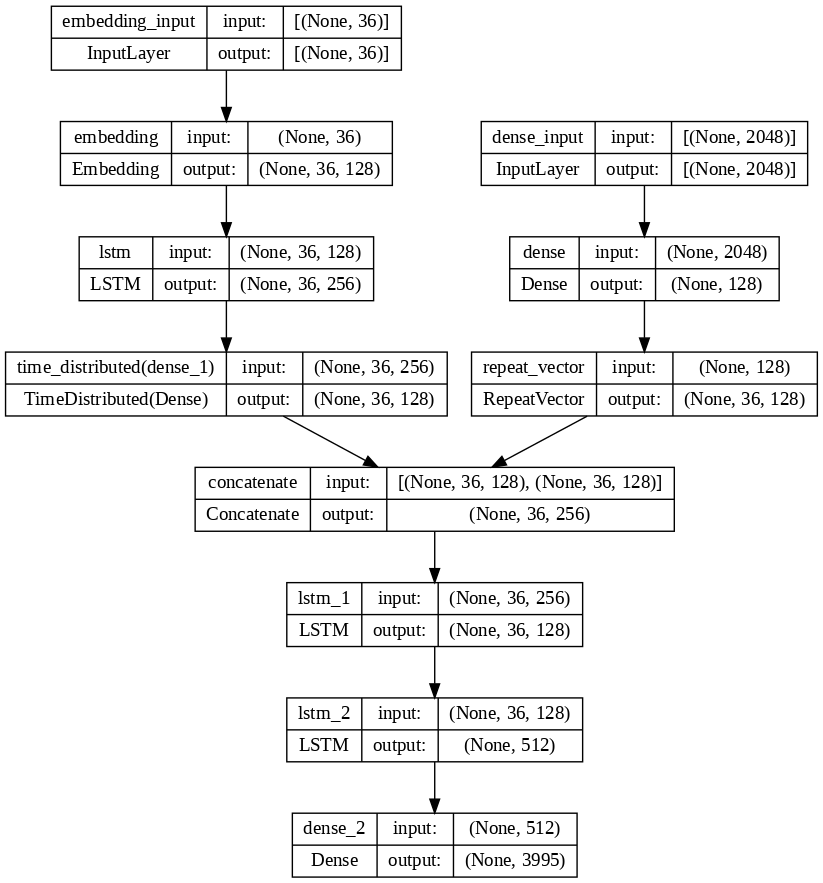

In [45]:
plot_model(final_model,'model.png',show_shapes=True,dpi=100)

In [46]:
mc = ModelCheckpoint('image_caption_generator.h5',monitor='accuracy',verbose=1,mode='max',save_best_only=True)

final_model.fit([X,y_in],
                y_out,
                batch_size=512,
                callbacks=mc,
                epochs=200)

Epoch 1/200
188/188 [==============================] - ETA: 0s - loss: 5.3463 - accuracy: 0.1121
Epoch 1: accuracy improved from -inf to 0.11208, saving model to image_caption_generator.h5
188/188 [==============================] - 34s 133ms/step - loss: 5.3463 - accuracy: 0.1121
Epoch 2/200
188/188 [==============================] - ETA: 0s - loss: 5.1691 - accuracy: 0.1176
Epoch 2: accuracy improved from 0.11208 to 0.11761, saving model to image_caption_generator.h5
188/188 [==============================] - 18s 95ms/step - loss: 5.1691 - accuracy: 0.1176
Epoch 3/200
188/188 [==============================] - ETA: 0s - loss: 5.1002 - accuracy: 0.1181
Epoch 3: accuracy improved from 0.11761 to 0.11812, saving model to image_caption_generator.h5
188/188 [==============================] - 17s 89ms/step - loss: 5.1002 - accuracy: 0.1181
Epoch 4/200
188/188 [==============================] - ETA: 0s - loss: 5.0299 - accuracy: 0.1182
Epoch 4: accuracy improved from 0.11812 to 0.11821, savi

In [47]:
# Creating an inverse dictionary with reverse key-value pairs
inverse_dict = {val: key for key,val in count_words.items()}

In [48]:
print(inverse_dict)

{1: 'startofseq', 2: 'a', 3: 'man', 4: 'in', 5: 'an', 6: 'orange', 7: 'hat', 8: 'starring', 9: 'at', 10: 'something', 11: '.', 12: 'endofseq', 13: 'wears', 14: 'and', 15: 'glasses', 16: 'with', 17: 'gauges', 18: 'is', 19: 'wearing', 20: 'blitz', 21: 'beer', 22: 'can', 23: 'crocheted', 24: 'the', 25: 'pierced', 26: 'ears', 27: 'couple', 28: 'infant', 29: ',', 30: 'being', 31: 'held', 32: 'by', 33: 'male', 34: 'sitting', 35: 'next', 36: 'to', 37: 'pond', 38: 'near', 39: 'stroller', 40: 'sit', 41: 'on', 42: 'grass', 43: 'baby', 44: 'their', 45: 'newborn', 46: 'under', 47: 'tree', 48: 'facing', 49: 'lake', 50: 'woman', 51: 'care', 52: 'for', 53: 'along', 54: 'side', 55: 'of', 56: 'body', 57: 'water', 58: 'outdoors', 59: 'black', 60: 'dog', 61: 'carries', 62: 'green', 63: 'toy', 64: 'his', 65: 'mouth', 66: 'as', 67: 'he', 68: 'walks', 69: 'through', 70: 'carrying', 71: 'has', 72: 'blue', 73: 'its', 74: 'item', 75: 'wet', 76: 'boy', 77: 'stick', 78: 'kneeling', 79: 'front', 80: 'goalie', 81:

#Saving the model

In [49]:
final_model.save('image_caption_generator.h5')

In [50]:
np.save('vocab.npy',count_words)

#Testing

In [51]:
# Custom function for extracting an image and transforming it into an appropriate format
def getImage(idx):
    test_img_path = images[idx]
    test_img = cv2.imread(test_img_path)
    test_img = cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB)
    test_img = cv2.resize(test_img,(224,224))
    test_img = np.reshape(test_img,(1,224,224,3))
    return test_img

1/1 [==============================] - 0s 22ms/step


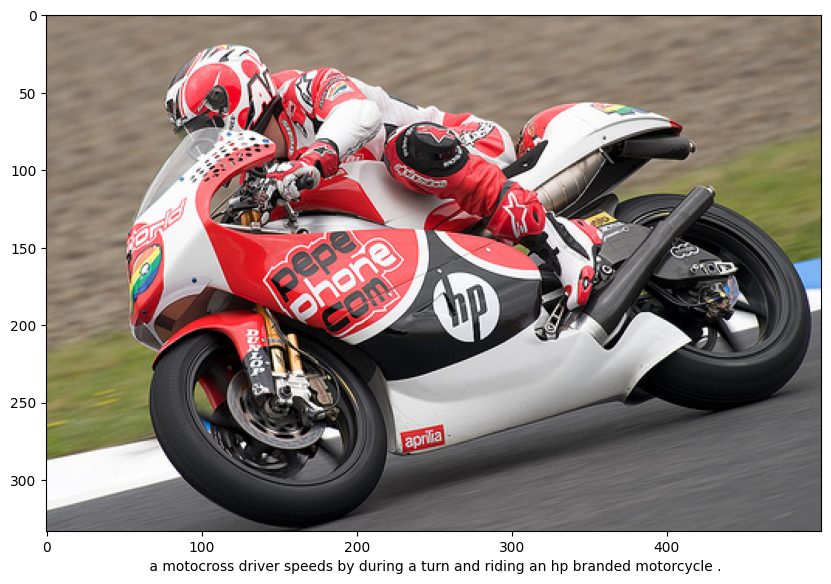

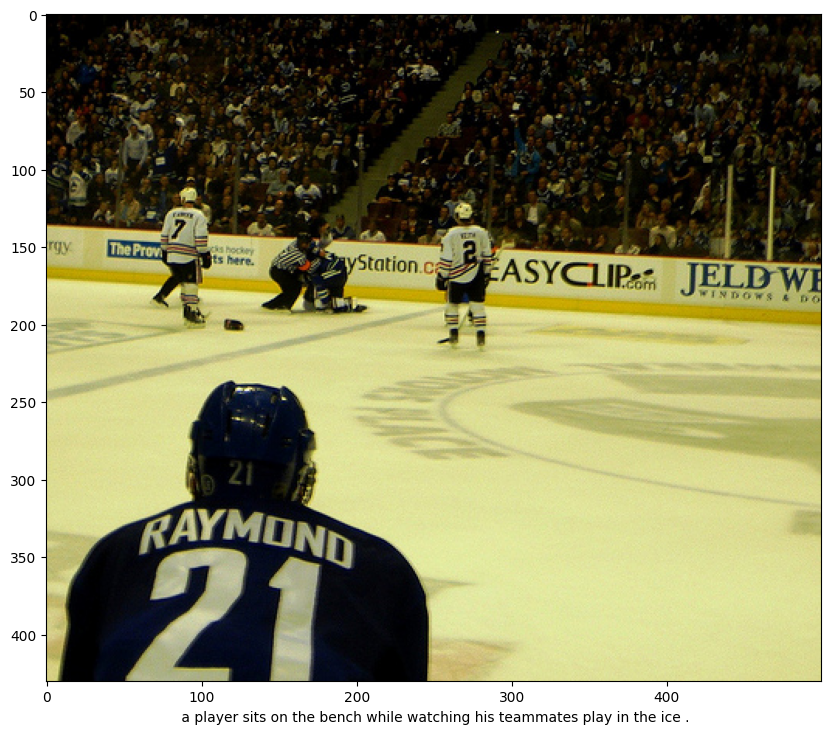

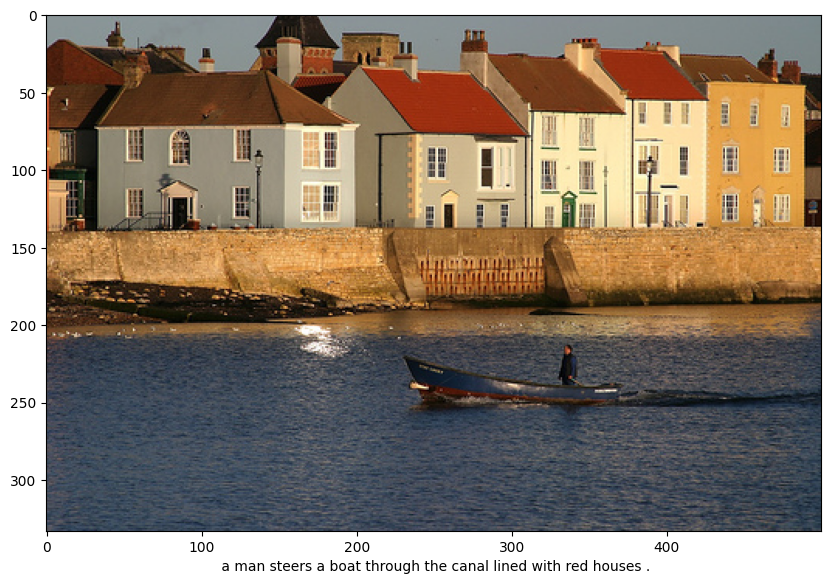

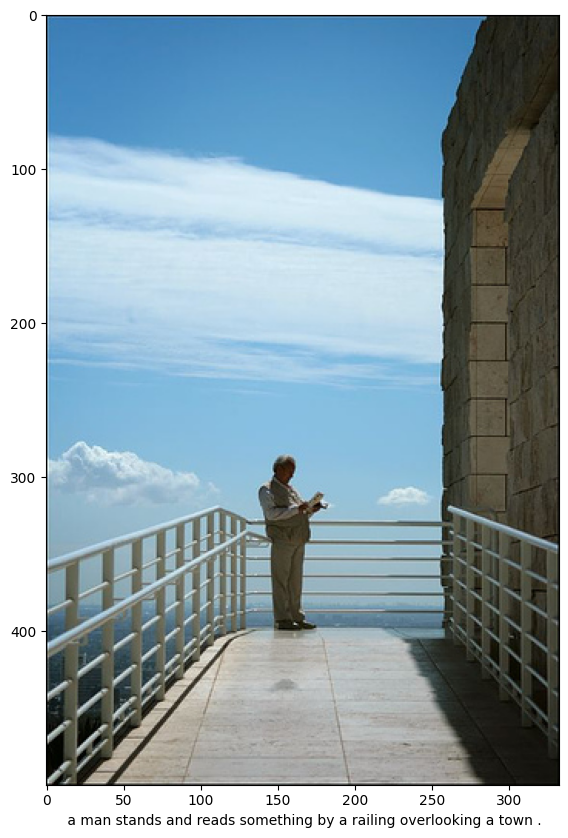

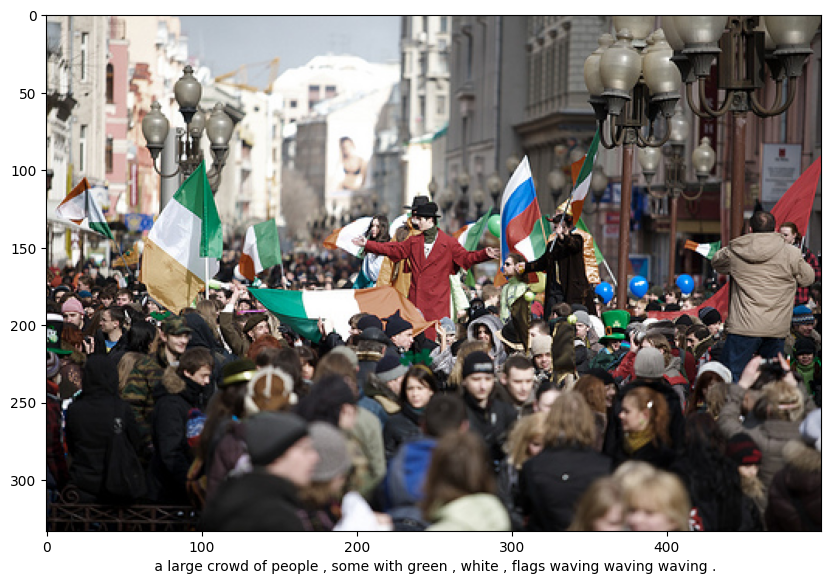

...

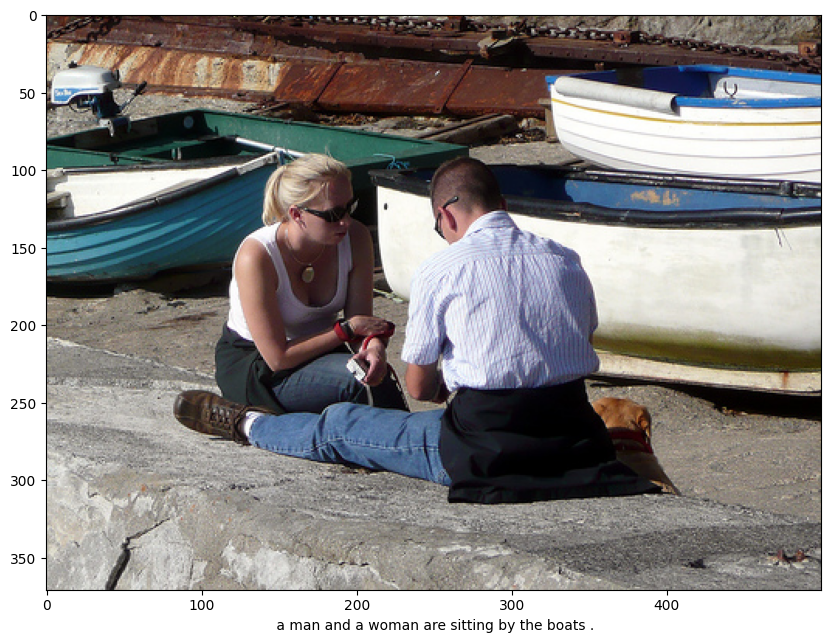

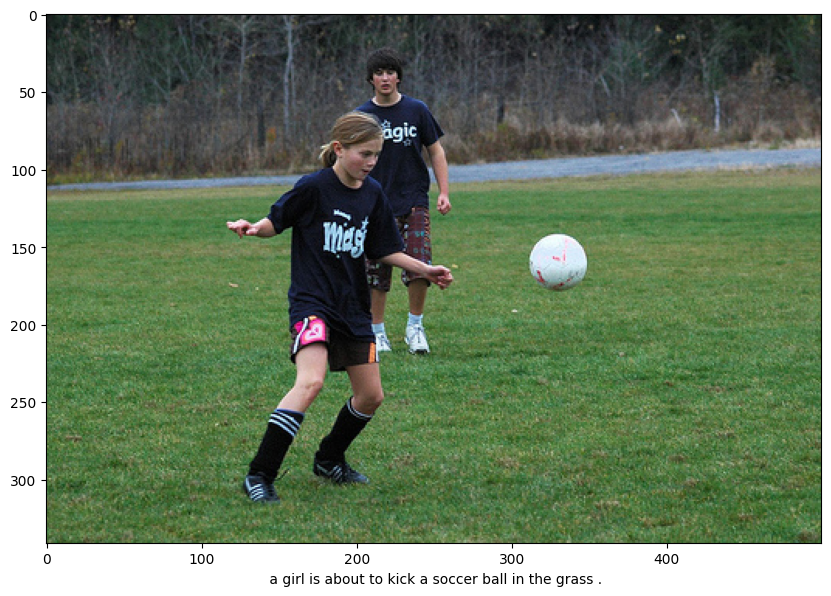

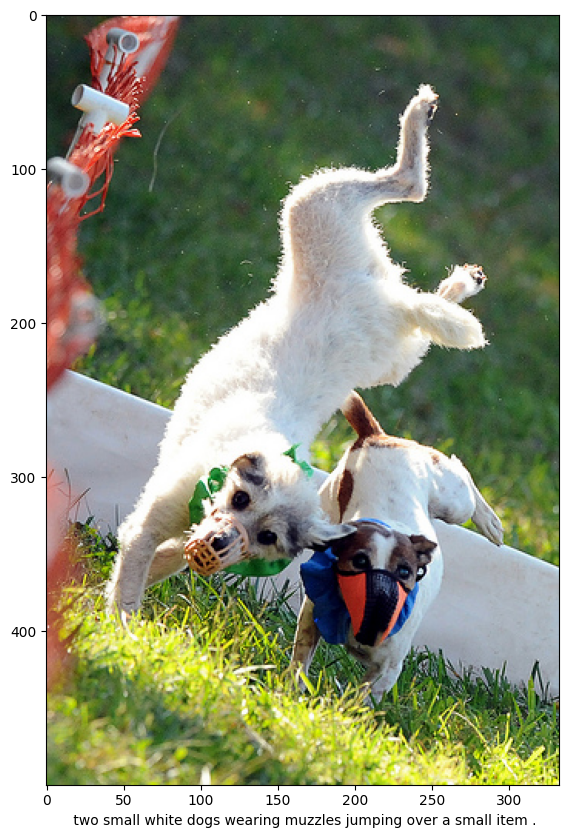

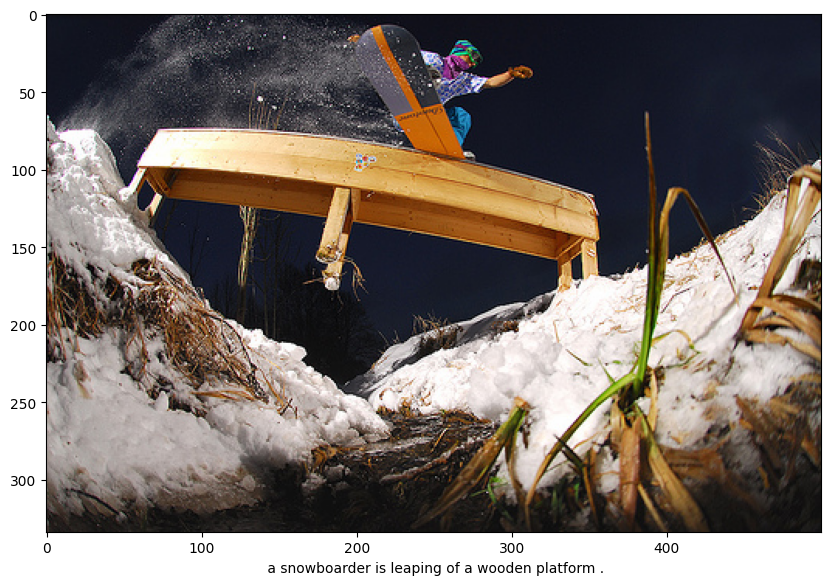

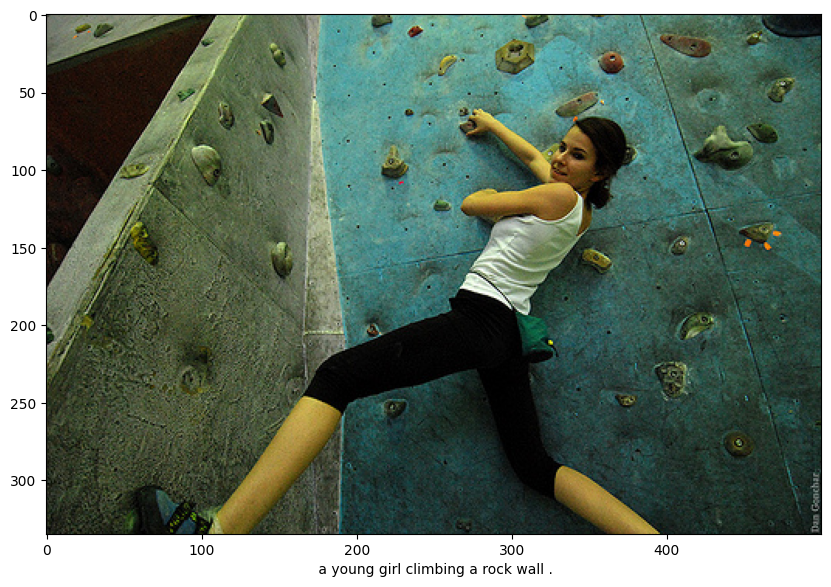

In [53]:
for i in range(15):
    random_no = np.random.randint(0,1501,(1,1))[0,0]
    test_feature = model.predict(getImage(random_no)).reshape(1,2048)
    test_img_path = images[random_no]
    test_img = cv2.imread(test_img_path)
    test_img = cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB)
    pred_text = ['startofseq']
    count = 0
    caption = '' # Stores the predicted captions text

    while count < 25:
        count += 1
        # Encoding the captions text with numbers
        encoded = []

        for i in pred_text:
            encoded.append(count_words[i])

        encoded = [encoded]
        # Padding the encoded text sequences to maximum length
        encoded = pad_sequences(encoded,maxlen=MAX_LEN,padding='post',truncating='post')
        pred_idx = np.argmax(final_model.predict([test_feature,encoded])) # Fetching the predicted word index having the maximum probability of occurrence
        sampled_word = inverse_dict[pred_idx] # Extracting the predicted word by its respective index
        # Checking for ending of the sequence
        if sampled_word == 'endofseq':
            break
        caption = caption + ' ' + sampled_word
        pred_text.append(sampled_word)

    plt.figure(figsize=(10,10))
    plt.imshow(test_img)
    plt.xlabel(caption)

#Submission